# **Computação Científica e Análise de Dados - 2024/02**

## **Projeto Final da Disciplina**

## **Eigenfaces (Autofaces): Uma aplicação do PCA para manipulação de imagens**

### **Professor: João Antônio Récio da Paixão**

### **Aluno: Milton Salgado Leandro - DRE: 122169279**

# **Introdução**

O reconhecimento facial é uma das áreas mais pesquisadas em visão computacional, com aplicações que vão desde segurança e autenticação até a interação homem-máquina. Um dos métodos mais amplamente utilizados para a análise e compressão de imagens faciais é o método **Eigenfaces**, que se baseia na técnica estatística conhecida como **Análise de Componentes Principais (Principal Component Analysis - PCA)**.

### Análise de Componentes Principais (PCA)

O PCA é uma técnica estatística que transforma um conjunto de variáveis possivelmente correlacionadas em um novo conjunto de variáveis não correlacionadas, denominadas **componentes principais**. Estas componentes principais são obtidas de tal forma que a primeira componente captura a maior variância dos dados, a segunda componente captura a maior variância residual, e assim sucessivamente. Isso permite reduzir a dimensionalidade dos dados com o menor prejuízo possível para a sua variabilidade original.

Matematicamente, o PCA identifica as **direções principais** dos dados, que são os **autovetores** de uma matriz de covariância ou de uma matriz de dispersão de dados, associadas aos maiores **autovalores**. Essas direções principais representam os eixos de máxima variância dos dados.

No contexto de imagens, o PCA pode ser usado para encontrar padrões relevantes, como texturas, bordas e características estruturais, e eliminar ruídos ou redundâncias. Isso o torna ideal para representar rostos em um espaço de dimensões reduzidas, mantendo informações essenciais para diferenciação.

### Eigenfaces e seus Criadores

O conceito de **Eigenfaces** foi introduzido por Matthew Turk e Alex Pentland no início da década de 1990. Em seu trabalho seminal, "Eigenfaces for Recognition", os pesquisadores demonstraram como o PCA pode ser aplicado para criar um sistema eficiente de reconhecimento facial. O método ganhou reconhecimento devido à sua abordagem inovadora de representar rostos como combinações lineares de um conjunto de **autofaces**, que são os autovetores obtidos do PCA aplicado a um conjunto de imagens faciais.

### Relação entre Eigenfaces e PCA

A relação entre Eigenfaces e PCA se dá pela representação de imagens como vetores em um espaço de alta dimensionalidade e pela análise estatística para encontrar padrões dominantes nesses dados. Para entender essa relação, é importante descrever os principais conceitos matemáticos envolvidos:

1. **Representação das Imagens como Vetores:**  
   Cada imagem facial é convertida em um vetor unidimensional. Por exemplo, uma imagem de dimensão $m \times n$ (com $m$ linhas e $n$ colunas) é transformada em um vetor de dimensão $m \times n$, empilhando seus valores de pixel em sequência.

2. **Matriz de Imagens:**  
   As imagens vetorizadas são organizadas em uma matriz $X$, onde cada linha (ou coluna, dependendo da implementação) corresponde a uma imagem. Supondo que temos $p$ imagens de dimensão $m \times n$, $X$ terá dimensões  $p \times mn$(ou $mn \times p$).

3. **Matriz de Covariância:**  
   A matriz de covariância $C$ é calculada a partir da matriz de imagens centralizada $X_c$ (obtida subtraindo a face média de cada vetor de imagem). Esta matriz representa a correlação estatística entre os dados e possui dimensão $p \times p$ (se calculada como $C = X_c X_c^T$, ou $mn \times mn$ se calculada como $C = X_c^T X_c$).

4. **Autovetores e Autovalores:**  
   O PCA é aplicado à matriz de covariância $C$ para encontrar seus autovetores e autovalores. Os autovetores representam as **direções principais** de variância nos dados, enquanto os autovalores indicam a importância relativa de cada direção. No contexto de Eigenfaces, os autovetores são as **autofaces**, que constituem uma base ortogonal no espaço das imagens.

5. **Projeção no Espaço das Faces:**  
   Cada imagem pode ser projetada no espaço gerado pelas autofaces, reduzindo sua dimensionalidade. Ao selecionar apenas os $k$ autovetores principais, é possível representar as imagens em um subespaço de dimensão $k$, capturando a maior parte da variação nos dados com uma compactação significativa.

6. **Reconstrução e Reconhecimento:**  
   A partir da projeção no espaço das faces, é possível reconstruir as imagens originais como combinações lineares das autofaces. Além disso, as projeções servem como vetores de características para reconhecimento facial, permitindo comparar imagens com base em suas representações compactas.

Essa relação entre Eigenfaces e PCA demonstra como a análise estatística pode ser aplicada para identificar padrões em grandes conjuntos de dados e utilizá-los para tarefas práticas, como compressão e classificação.



### Objetivo

Neste trabalho, o objetivo foi implementar o método Eigenfaces utilizando PCA para análise e compressão de imagens faciais. Além disso, exploramos a aplicação do modelo em tarefas como aproximação de imagens e reconhecimento facial, demonstrando como o PCA pode ser utilizado para extrair informações relevantes e reduzir a dimensionalidade de imagens em um contexto prático.

# **Coleta e Preparação dos Dados**

Para este projeto, foram utilizados três conjuntos de dados distintos para a análise de reconhecimento facial por meio do método Eigenfaces. A seguir, apresentamos uma descrição detalhada de cada dataset, incluindo informações adicionais relevantes.

## Conjuntos de Dados

### 1. Large-scale CelebFaces Attributes (CelebA) Dataset

O **CelebA** (reduzido) é um conjunto de dados de larga escala que contém 4986 imagens de rostos de celebridades, cada uma anotada com 40 atributos binários que descrevem características faciais, como cor do cabelo, presença de óculos, gênero e idade. As imagens apresentam uma ampla variedade de poses e fundos, tornando este dataset adequado para tarefas como reconhecimento facial, detecção de faces, localização de pontos de referência faciais e edição ou síntese de faces. 

**Características principais:**

- **Número de imagens:** 4.986
- **Anotações:** 5 pontos de referência faciais e 40 atributos binários por imagem
- **Formato dos arquivos:** JPEG
- **Resolução das imagens:** 178×218 pixels

**Aplicações comuns:**

- Reconhecimento de atributos faciais
- Detecção e reconhecimento facial
- Localização de pontos de referência faciais
- Edição e síntese de imagens faciais

**Disponibilidade:**

O dataset está disponível para uso em pesquisas não comerciais e pode ser acessado através do [site oficial do CelebA](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html).

### 2. Extended Yale Face Database B

O **Extended Yale Face Database B** é uma extensão do Yale Face Database B original e contém imagens de 38 indivíduos, cada um fotografado sob 64 condições de iluminação diferentes, totalizando 2.432 imagens de rostos (2.452 contando as imagens de fundo). As imagens são em escala de cinza e foram capturadas em condições controladas, variando a iluminação e as expressões faciais dos sujeitos. 

**Características principais:**

- **Número de imagens:** 2.432 (2.452 com imagens de fundo)
- **Número de indivíduos:** 38
- **Condições de iluminação:** 64 variações por indivíduo
- **Formato dos arquivos:** PNG
- **Resolução das imagens:** 192×168 pixels

**Aplicações comuns:**

- Estudos sobre o impacto da iluminação no reconhecimento facial
- Desenvolvimento e teste de algoritmos robustos a variações de iluminação
- Análise de expressões faciais

**Disponibilidade:**

O dataset pode ser acessado para fins de pesquisa através do [site oficial do Extended Yale Face Database B](https://vision.ucsd.edu/datasets/extended-yale-face-database-b-b).

### 3. The Database of Faces (AT&T)

Conhecido anteriormente como **ORL Database of Faces**, este conjunto de dados foi coletado entre 1992 e 1994 no Olivetti Research Laboratory e contém imagens de 40 indivíduos, cada um com 10 imagens, totalizando 400 fotos. As imagens são em escala de cinza e apresentam variações de expressões faciais (como sorrindo ou com olhos fechados) e posições (inclinações e rotações da cabeça). 

**Características principais:**

- **Número de imagens:** 400
- **Número de indivíduos:** 40
- **Variações:** Expressões faciais e posições da cabeça
- **Formato dos arquivos:** PGM
- **Resolução das imagens:** 92×112 pixels

**Aplicações comuns:**

- Desenvolvimento e teste de algoritmos de reconhecimento facial
- Análise de variações de pose e expressão no reconhecimento
- Estudos comparativos de desempenho de diferentes métodos

**Disponibilidade:**

O dataset está disponível para uso em pesquisas e pode ser acessado através do [site oficial do AT&T Laboratories Cambridge](https://cam-orl.co.uk/facedatabase.html).

A utilização desses três conjuntos de dados diversificados permite uma análise abrangente das capacidades do método Eigenfaces em diferentes cenários, considerando variações de iluminação, pose, expressão e diversidade de indivíduos. 

## Conversão e Tratamento dos Dados

Nesta etapa, as imagens dos três datasets utilizados foram processadas para garantir uniformidade em termos de tamanho e formato. Isso é fundamental para o correto funcionamento do modelo Eigenfaces, que depende da representação vetorial uniforme de todas as imagens.

### Conversão de Formato

Inicialmente, as imagens do **The Database of Faces (AT&T)**, armazenadas no formato `.pgm`, foram convertidas para `.png`. Essa conversão foi realizada utilizando um script em Python (`redimensionar.py`, encontrado na pasta `utils`), garantindo compatibilidade com ferramentas de visualização e processamento mais modernas. As imagens em outros formatos, como `.jpg` e `.png`, foram mantidas como estavam.

### Redimensionamento

Todas as imagens, independentemente do dataset de origem, foram redimensionadas para uma dimensão específica durante o processamento:
- **180 × 220 pixels (Tamanho Atual):** Tamanho uniforme utilizado no modelo final.

Esse redimensionamento foi implementado utilizando o arquivo `redimensionar.py` (encontrado na pasta `utils`) para garantir que todas as imagens tenham dimensões idênticas, facilitando sua representação como vetores e o cálculo das autofaces por meio da Análise de Componentes Principais (PCA).

### Visualização do Antes e Depois

Para validar o sucesso das transformações, as imagens foram exibidas lado a lado, já padronizadas e redimensionadas. Esse processo permitiu verificar visualmente que o redimensionamento preservou as características principais de cada imagem enquanto as padronizava.

### Benefícios do Tratamento

1. **Uniformidade:** Todos os datasets foram ajustados para um formato e dimensão comuns, eliminando variações que poderiam impactar os resultados do modelo.
2. **Compatibilidade:** A conversão de formatos garantiu que todas as imagens pudessem ser processadas de forma consistente.
3. **Preparação para o PCA:** O redimensionamento adequado assegurou que as imagens fossem vetorizadas corretamente, permitindo o cálculo preciso das autofaces.

Com esses ajustes, os dados estavam prontos para serem utilizados no modelo de Eigenfaces.

As mudanças de tamanho podem ser vistas nas imagens abaixo:

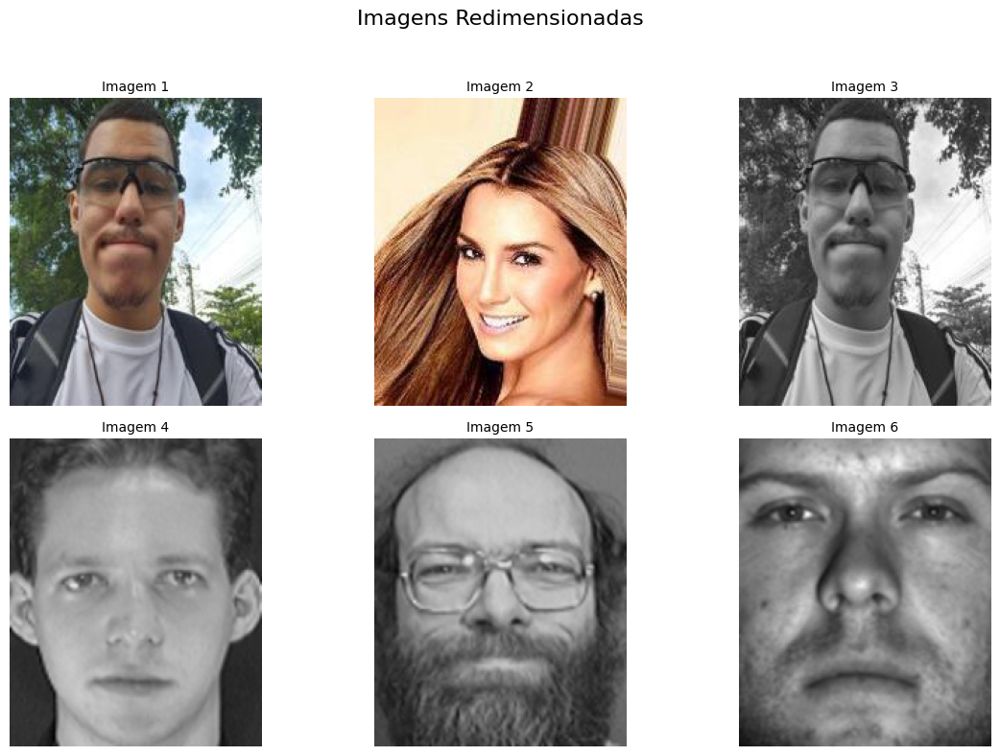

In [1]:
from auxiliares import ler_imagens, exibir_imagens

diretorio_teste = "../assets/images/test"

imagens_teste = ler_imagens(diretorio_teste)

titulos_imagens = [f"Imagem {i + 1}" for i in range(len(imagens_teste))]

exibir_imagens(imagens_teste, num_colunas=3, titulo_grid="Imagens Redimensionadas", titulos_imagens=titulos_imagens)


## Data Flattening

O **Data Flattening** é um passo essencial no pré-processamento de imagens para modelos como Eigenfaces. Essa etapa consiste em transformar as imagens, originalmente representadas como matrizes bidimensionais (ou tridimensionais para imagens coloridas), em vetores unidimensionais. Essa transformação é necessária porque os métodos de álgebra linear, como a Análise de Componentes Principais (PCA), operam em dados vetorizados.

### Representação Original das Imagens

Cada imagem é inicialmente representada como uma matriz $M$ de dimensão $h \times w$, onde:
- $h$ é a altura da imagem (número de linhas),
- $w$ é a largura da imagem (número de colunas).

No caso de imagens coloridas, há uma terceira dimensão $c$, que representa o número de canais de cor (geralmente 3 para RGB). Assim:
$$
M \in \mathbb{R}^{h \times w \times c} \quad \text{(imagens coloridas)},
$$
ou
$$
M \in \mathbb{R}^{h \times w} \quad \text{(imagens em escala de cinza)}.
$$

Por exemplo, uma imagem colorida de dimensão $180 \times 220$ terá três canais, totalizando uma representação tridimensional com dimensão $180 \times 220 \times 3$.

### Operação de Flattening

A operação de flattening transforma a matriz $M$ em um vetor unidimensional $v$. Matematicamente, o vetor achatado $v$ é obtido reorganizando os elementos da matriz $M$ em uma única sequência. Para uma imagem em escala de cinza, isso resulta em um vetor:

$$
v = \text{flatten}(M), \quad v \in \mathbb{R}^{h \cdot w}.
$$

Se a imagem for colorida, a operação concatena os valores de cada canal, resultando em:
$$
v = \text{flatten}(M), \quad v \in \mathbb{R}^{h \cdot w \cdot c}.
$$

Por exemplo:
- Uma imagem colorida de $180 \times 220$ será convertida em um vetor de dimensão $118,800$ ($180 \cdot 220 \cdot 3$).
- Uma imagem em escala de cinza de $180 \times 220$ será convertida em um vetor de dimensão $39,600$ ($180 \cdot 220$).

### Construção da Matriz de Dados

Ao processar um conjunto de $n$ imagens, cada vetor achatado $v$ é adicionado como uma linha em uma matriz $X$, onde cada linha representa uma imagem. Assim, $X$ é a matriz de dados com todas as imagens no formato vetorizado, com dimensão:

$$
X \in \mathbb{R}^{n \times d},
$$
onde:
- $n$: número de imagens,
- $d = h \cdot w \cdot c$: dimensão do vetor achatado.

Por exemplo, para um dataset de 100 imagens em escala de cinza com dimensões $180 \times 220$, a matriz $X$ terá dimensão:

$$
X \in \mathbb{R}^{100 \times 39,600}.
$$

Essa matriz é essencial para os passos subsequentes, como centralização dos dados e cálculo de componentes principais.

### Importância do Flattening

O flattening permite:
1. Representar imagens de forma unificada como vetores em um espaço de alta dimensionalidade.
2. Integrar os dados em uma matriz estruturada $X$, onde cada linha corresponde a uma amostra (imagem).
3. Facilitar a aplicação de técnicas de álgebra linear, como a Análise de Componentes Principais (PCA), para encontrar padrões nos dados.

Essa transformação, embora simples, é fundamental para que os dados de imagem sejam compatíveis com os métodos matemáticos utilizados na modelagem de Eigenfaces. Com o flattening concluído, os dados estão prontos para serem centralizados e analisados.

### Exemplo de Flattening

Considere uma imagem em escala de cinza representada pela matriz $M$ com dimensões $2 \times 3$. A matriz pode ser escrita como:

$$
M =
\begin{bmatrix}
m_{11} & m_{12} & m_{13} \\
m_{21} & m_{22} & m_{23}
\end{bmatrix}.
$$

O processo de flattening transforma essa matriz em um vetor unidimensional $v$, reorganizando suas entradas linha por linha. O vetor resultante terá dimensão $6$ ($2 \cdot 3$) e será representado como:

$$
v = 
\begin{bmatrix}
m_{11}, m_{12}, m_{13}, m_{21}, m_{22}, m_{23}
\end{bmatrix}^T.
$$

Ou, mais explicitamente:

$$
v =
\begin{bmatrix}
m_{11} \\
m_{12} \\
m_{13} \\
m_{21} \\
m_{22} \\
m_{23}
\end{bmatrix}.
$$

Se a matriz original tiver dimensão $h \times w$, o vetor achatado $v$ terá dimensão $h \cdot w$. Este vetor unidimensional pode então ser usado para construir a matriz de dados $X$, onde cada linha corresponde ao flattening de uma imagem diferente. Além disso, se a imagem for colorida, o processo de flattening concatenará os valores de cada canal de cor para formar um vetor de dimensão $h \cdot w \cdot c$, como mostrado abaixo:

Considere uma imagem colorida com três canais (RGB), representada por uma matriz tridimensional $M$ de dimensões $2 \times 3 \times 3$. Aqui:
- $h = 2$: altura da imagem,
- $w = 3$: largura da imagem,
- $c = 3$: número de canais (vermelho, verde, azul).

A matriz pode ser escrita como:

$$
M =
\begin{bmatrix}
\text{R} & \text{G} & \text{B} \\
\text{R} & \text{G} & \text{B}
\end{bmatrix},
$$

onde $\text{R}, \text{G}, \text{B}$ representam os valores de cor nos canais vermelho, verde e azul, respectivamente, para cada pixel.

Cada canal $M_R, M_G, M_B$ é uma matriz $2 \times 3$, e o flattening é realizado separadamente para cada canal. Os canais são concatenados em sequência para formar um vetor unidimensional $v$. O resultado será:

$$
v = 
\begin{bmatrix}
M_R \,|\, M_G \,|\, M_B
\end{bmatrix},
$$

onde:

$$
M_R =
\begin{bmatrix}
r_{11} & r_{12} & r_{13} \\
r_{21} & r_{22} & r_{23}
\end{bmatrix},
\quad
M_G =
\begin{bmatrix}
g_{11} & g_{12} & g_{13} \\
g_{21} & g_{22} & g_{23}
\end{bmatrix},
\quad
M_B =
\begin{bmatrix}
b_{11} & b_{12} & b_{13} \\
b_{21} & b_{22} & b_{23}
\end{bmatrix}.
$$

Após o flattening e a concatenação, o vetor unidimensional $v$ será:

$$
v =
\begin{bmatrix}
r_{11}, r_{12}, r_{13}, r_{21}, r_{22}, r_{23}, \, g_{11}, g_{12}, g_{13}, g_{21}, g_{22}, g_{23}, \, b_{11}, b_{12}, b_{13}, b_{21}, b_{22}, b_{23}
\end{bmatrix}^T.
$$

A dimensão do vetor $v$ será:

$$
\text{dim}(v) = h \cdot w \cdot c = 2 \cdot 3 \cdot 3 = 18.
$$

## Cálculo da Face Média

A face média é uma etapa essencial no processamento de imagens faciais para o método Eigenfaces. Ela representa a "média" de todas as imagens do dataset em cada posição de pixel. Essa média é utilizada para centralizar os dados, removendo informações redundantes e facilitando a análise das variações faciais entre as imagens.

### Definição da Face Média

Dado um conjunto de $n$ imagens $I_1, I_2, \dots, I_n$, cada uma representada como um vetor achatado $v_i$ de dimensão $d$ (onde $d = h \cdot w$, sendo $h$ a altura e $w$ a largura da imagem), a face média $\mu$ é calculada como a média aritmética de todos os vetores $v_i$. Matematicamente, temos:

$$
\mu = \frac{1}{n} \sum_{i=1}^n v_i,
$$

onde:
- $\mu \in \mathbb{R}^d$: vetor da face média,
- $n$: número total de imagens no dataset,
- $v_i \in \mathbb{R}^d$: vetor achatado da $i$-ésima imagem.

### Etapas do Cálculo

1. **Flattening das Imagens**:
   Cada imagem $I_i$ do dataset é achatada para formar um vetor unidimensional $v_i$. Isso transforma cada imagem de uma matriz $h \times w$ (ou $h \times w \times c$ para imagens coloridas) em um vetor de dimensão $d$.

2. **Somatório dos Vetores**:
   Todos os vetores $v_i$ são somados elemento por elemento para obter o vetor soma $S$:
  $$
   S = \sum_{i=1}^n v_i.
  $$

3. **Divisão pelo Número de Imagens**:
   O vetor soma $S$ é dividido pelo número total de imagens $n$ para calcular a média em cada posição de pixel:
  $$
   \mu = \frac{1}{n} S.
  $$

4. **Reconstrução da Face Média**:
   O vetor $\mu$ é reformatado para o formato original da imagem ($h \times w$) para ser visualizado como uma imagem.

### Interpretação da Face Média

A face média é uma visualização que combina as características faciais compartilhadas por todas as imagens do dataset. É importante notar que a face média geralmente aparece desfocada, pois é uma combinação linear de múltiplas faces com diferentes características.

No contexto de Eigenfaces, a face média é subtraída de todas as imagens antes de calcular as autofaces. Isso remove a contribuição constante dos pixels, deixando apenas as variações faciais como informações úteis.

### Exemplo de Cálculo da Face Média

Suponha que temos 3 imagens $v_1, v_2, v_3$, cada uma achatada com 4 pixels (dimensão $d = 4$):

$$
v_1 = \begin{bmatrix} 10 \\ 20 \\ 30 \\ 40 \end{bmatrix}, \quad
v_2 = \begin{bmatrix} 15 \\ 25 \\ 35 \\ 45 \end{bmatrix}, \quad
v_3 = \begin{bmatrix} 20 \\ 30 \\ 40 \\ 50 \end{bmatrix}.
$$

A soma dos vetores é:
$$
S = v_1 + v_2 + v_3 = 
\begin{bmatrix} 10 \\ 20 \\ 30 \\ 40 \end{bmatrix} +
\begin{bmatrix} 15 \\ 25 \\ 35 \\ 45 \end{bmatrix} +
\begin{bmatrix} 20 \\ 30 \\ 40 \\ 50 \end{bmatrix} =
\begin{bmatrix} 45 \\ 75 \\ 105 \\ 135 \end{bmatrix}.
$$

A face média é calculada como:
$$
\mu = \frac{1}{3}, S =
\frac{1}{3} 
\begin{bmatrix} 45 \\ 75 \\ 105 \\ 135 \end{bmatrix} =
\begin{bmatrix} 15 \\ 25 \\ 35 \\ 45 \end{bmatrix}.
$$

A face média resultante $\mu$ pode ser convertida de volta para o formato $h \times w$ com o Data Flattening para visualização.

Esse processo garante que todas as imagens do dataset sejam centralizadas em torno de uma base comum antes da aplicação do PCA, simplificando a análise das variações faciais.

Abaixo, foram calculadas as faces médias de cada um dos 3 conjuntos de dados utilizados.

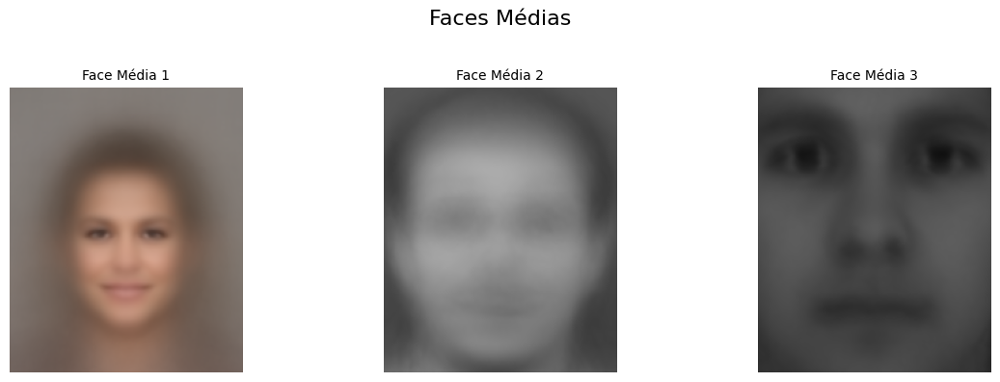

In [2]:
from auxiliares import ler_imagens, calcular_autofaces, exibir_faces_medias

faces_medias = []
lista_autofaces = []

diretorio_imagens = "../assets/images/database_1"
imagens = ler_imagens(diretorio_imagens, limite=2452)
face_media, autofaces = calcular_autofaces(imagens, num_autofaces=10)
lista_autofaces.append(autofaces)
faces_medias.append(face_media)

diretorio_imagens = "../assets/images/database_2"
imagens = ler_imagens(diretorio_imagens, limite=2452)
face_media, autofaces = calcular_autofaces(imagens, num_autofaces=10)
lista_autofaces.append(autofaces)
faces_medias.append(face_media)

diretorio_imagens = "../assets/images/database_3"
imagens = ler_imagens(diretorio_imagens, limite=2452)
face_media, autofaces = calcular_autofaces(imagens, num_autofaces=10)
lista_autofaces.append(autofaces)
faces_medias.append(face_media)

exibir_faces_medias(faces_medias)

## Cálculo das Autofaces

As autofaces são os autovetores associados aos maiores autovalores da matriz de covariância das imagens centralizadas. Esses autovetores representam as direções principais de variação nos dados e formam a base para o método Eigenfaces. 

No entanto, calcular diretamente os autovetores da matriz de covariância completa é inviável para datasets de alta dimensão devido à grande quantidade de memória e poder computacional necessários. Por isso, utilizamos a versão **reduzida** da matriz de covariância.

### Matriz de Covariância Completa

Dado o conjunto de imagens achatadas, organizadas em uma matriz de dados $X_{\text{centralizado}}$, onde cada linha é uma imagem centralizada (ou seja, subtraída da face média), a matriz de covariância completa $C$ é definida como:

$$
C = X_{\text{centralizado}}^T \cdot X_{\text{centralizado}}, \quad C \in \mathbb{R}^{d \times d},
$$

onde:
- $d$ é a dimensão de cada vetor achatado (número de pixels na imagem),
- $C$ teria dimensão $39,600 \times 39,600$ para imagens em escala de cinza ($180 \times 220$),
- Para imagens coloridas ($180 \times 220 \times 3$), $C$teria dimensão $118,800 \times 118,800$.

O cálculo direto de $C$ é computacionalmente proibitivo devido ao tamanho de $d$.

Em termos de comparação, obtive um tempo praticamente 6 vezes maior ao utilizar 2452 imagens de 2 dos 3 datasets para fazer a aproximação de imagens no próximo módulo (o tempo foi de aproximadamente 35 minutos) utilizando o método do PCA oferecido pela biblioteca cv2, em relação ao tempo obtido utilizando o método do PCA implementado manualmente com a matriz reduzida (aproximadamente 5 minutos).

### Redução da Matriz de Covariância

Ao invés de calcular a matriz $C$ diretamente, utilizamos a matriz reduzida $B$, que é muito menor e definida como:

$$
B = X_{\text{centralizado}} \cdot X_{\text{centralizado}}^T, \quad B \in \mathbb{R}^{n \times n},
$$

onde:
- $n$ é o número de imagens no dataset,
- $B$tem dimensão $n \times n$, que é significativamente menor que $d \times d$ (por exemplo, $5000 \times 5000$ para 5000 imagens no dataset).

### Relação entre as Matrizes $C$ e $B$

Os autovalores da matriz $B$ são iguais aos $n$ maiores autovalores da matriz $C$. Além disso, os autovetores da matriz $C$ podem ser reconstruídos a partir dos autovetores da matriz $B$ e da matriz $X_{\text{centralizado}}$.

Seja:
- $v_i$: um autovetor de $B$,
- $\lambda_i$: o autovalor correspondente.

O autovetor correspondente de $C$, $u_i$, é calculado como:

$$
u_i = X_{\text{centralizado}}^T \cdot v_i.
$$

Após calcular $u_i$, ele é normalizado para garantir que sua norma seja igual a 1.

### Etapas do Cálculo das Autofaces

1. **Centralização dos Dados**:
   Subtrai-se a face média de cada imagem, formando a matriz $X_{\text{centralizado}}$.

2. **Cálculo da Matriz Reduzida $B$**:
   Multiplicamos $X_{\text{centralizado}}$ por sua transposta:
  $$
   B = X_{\text{centralizado}} \cdot X_{\text{centralizado}}^T, \quad B \in \mathbb{R}^{n \times n}.
  $$

3. **Autovalores e Autovetores de $B$**:
   Calculamos os autovalores $\lambda_i$ e autovetores $v_i$ de $B$.

4. **Reconstrução dos Autovetores Originais**:
   Os autovetores originais da matriz $C$ são obtidos como:
  $$
   u_i = X_{\text{centralizado}}^T \cdot v_i.
  $$

5. **Normalização**:
   Cada autovetor $u_i$ é normalizado para ter norma unitária:
  $$
   u_i = \frac{u_i}{\|u_i\|}.
  $$

6. **Seleção dos Autovetores Principais**:
   Selecionam-se os $k$ maiores autovalores e seus autovetores correspondentes, onde $k$ é o número de autofaces desejado.

### Representação Matemática

Sejam:
- $X$ a matriz de imagens centralizadas,
- $U_k$ a matriz contendo os $k$ autovetores principais.

A matriz das autofaces é:

$$
U_k = \begin{bmatrix} u_1 & u_2 & \dots & u_k \end{bmatrix}.
$$

Cada coluna de $U_k$ é uma autoface, que pode ser visualizada ao ser reconvertida para o formato de imagem original.

### Importância das Autofaces

As autofaces capturam as direções principais de variação nos dados:
- A **primeira autoface** captura a maior variação possível,
- As **próximas autofaces** capturam variações residuais ortogonais à primeira.

Essas autofaces formam a base para projetar novas imagens no espaço reduzido, permitindo tarefas como reconhecimento facial e compressão de dados.

Seguem as imagens das 20 primeiras autofaces de cada um dos 3 conjuntos de dados utilizados, na forma de matrizes de imagens:

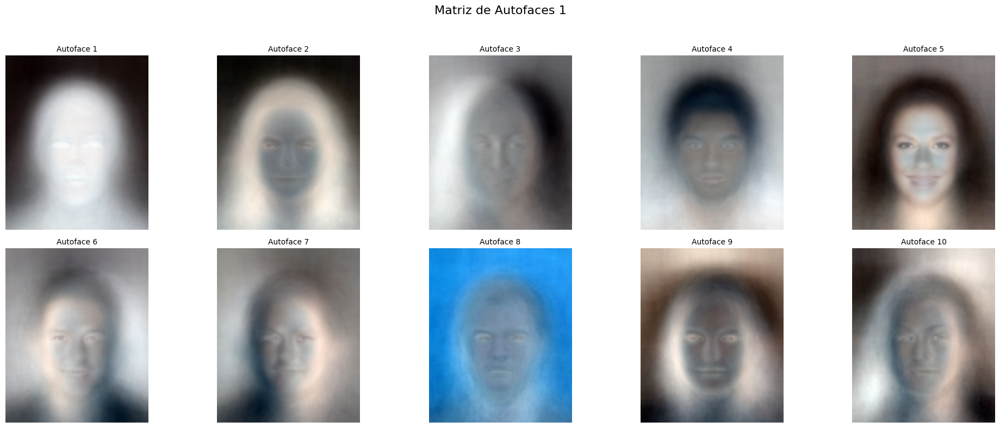

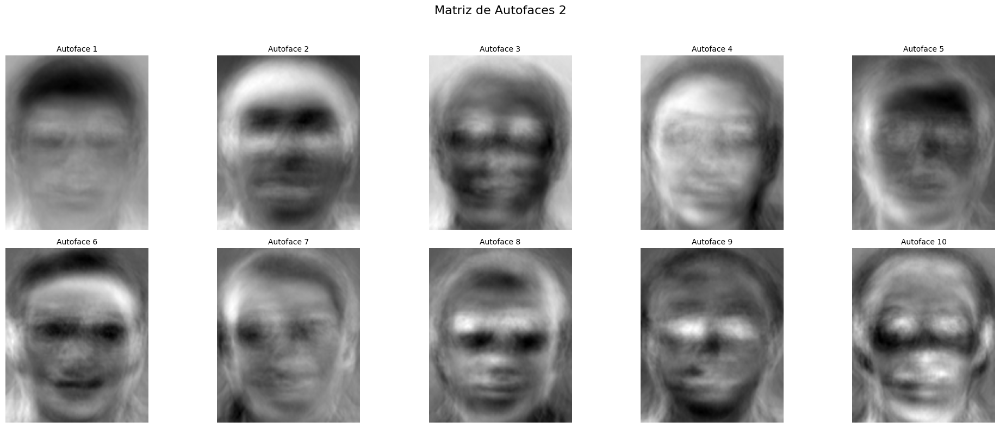

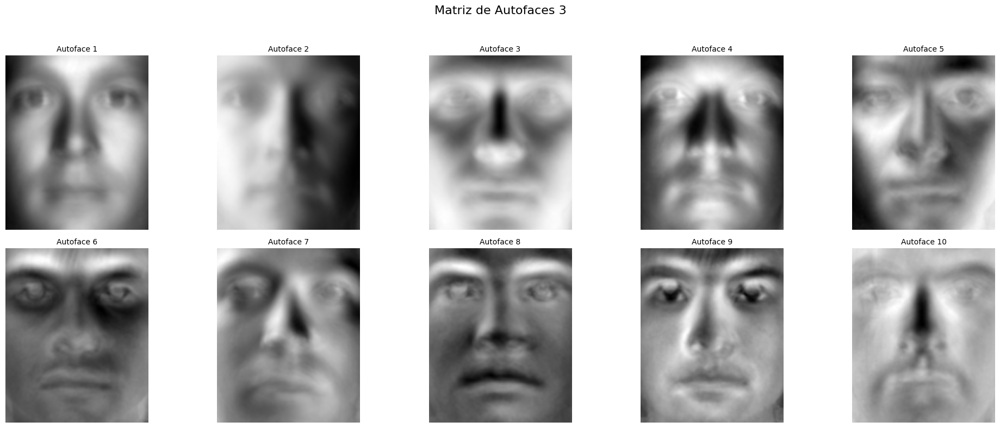

In [3]:
from auxiliares import exibir_autofaces, ler_imagens, calcular_autofaces

lista_autofaces = []

diretorio_imagens = "../assets/images/database_1"
imagens = ler_imagens(diretorio_imagens, limite=2452)
_, autofaces = calcular_autofaces(imagens, num_autofaces=10)
lista_autofaces.append(autofaces)

diretorio_imagens = "../assets/images/database_2"
imagens = ler_imagens(diretorio_imagens, limite=2452)
_, autofaces = calcular_autofaces(imagens, num_autofaces=10)
lista_autofaces.append(autofaces)

diretorio_imagens = "../assets/images/database_3"
imagens = ler_imagens(diretorio_imagens, limite=2452)
_, autofaces = calcular_autofaces(imagens, num_autofaces=10)
lista_autofaces.append(autofaces)

for i, autofaces in enumerate(lista_autofaces):
    exibir_autofaces(autofaces, titulo=f"Matriz de Autofaces {i+1}")

# Módulo 1: Construção de Imagens

O primeiro módulo do projeto consiste em uma aplicação interativa que permite a construção de novas imagens faciais a partir das **autofaces** e da **face média**. Utilizando o método Eigenfaces, o usuário pode ajustar os pesos associados a cada autoface para criar combinações lineares e visualizar as novas imagens geradas em tempo real.

### Fórmula Matemática

A construção de uma nova imagem $F$ no espaço das autofaces pode ser expressa como:

$$
F = F_m + \sum_{i=1}^{k} \alpha_i F_i,
$$

onde:
- $F$ é a nova imagem gerada,
- $F_m$ é a **face média**, que serve como ponto de referência,
- $F_i$ é a $i$-ésima autoface (um autovetor que captura a direção principal de variação),
- $\alpha_i$ é um peso escalar ajustado pelo usuário, que pode ser positivo ou negativo,
- $k$ é o número de autofaces consideradas (neste caso, 15 por padrão).

Os pesos $\alpha_i$ determinam como cada autoface contribui para a nova imagem gerada. Valores positivos de $\alpha_i$ amplificam as características capturadas pela autoface, enquanto valores negativos as invertem.

### Processo Matemático

1. **Face Média**:
   A **face média** $F_m$ é a base de todas as combinações. É calculada como a média aritmética de todas as imagens no dataset.

2. **Contribuições das Autofaces**:
   Cada autoface $F_i$ é multiplicada por um peso $\alpha_i$ escolhido pelo usuário. A soma ponderada dessas contribuições é adicionada à face média para criar a nova imagem $F$.

3. **Combinação Linear**:
   O resultado final é a soma de todas as contribuições $\alpha_i \cdot F_i$ com a face média:
  $$
   F = F_m + \alpha_1 F_1 + \alpha_2 F_2 + \dots + \alpha_k F_k.
  $$

### Interface do Módulo

O módulo utiliza o OpenCV para criar uma interface gráfica que permite ao usuário manipular os pesos $\alpha_i$ interativamente:

- **Janelas do OpenCV**:
  - **"Resultado"**: Mostra a nova imagem gerada em tempo real à medida que os sliders são ajustados.
  - **"Autofaces e Pesos"**: Contém sliders para ajustar os pesos $\alpha_i$ de cada autoface.

- **Sliders**:
  Cada slider controla o peso $\alpha_i$ de uma autoface. Os valores variam entre $-127$ e $128$, onde $0$ corresponde à ausência de contribuição da autoface.

- **Atualização em Tempo Real**:
  Sempre que um slider é ajustado, a imagem $F$ é recalculada e exibida na janela "Resultado". Isso permite explorar como diferentes combinações de autofaces geram novas características faciais.

### Dataset e Aplicação

O módulo foi testado utilizando o dataset **CelebA**, que contém imagens coloridas. O uso desse dataset possibilitou a criação de imagens faciais coloridas e "divertidas", explorando a criatividade na geração de novas combinações faciais.

### Exemplo

Suponha que temos:
- $F_m$ representando a face média,
- $F_1$, $F_2$, $F_3$: três autofaces principais,
- Pesos escolhidos pelo usuário: $\alpha_1 = 2$, $\alpha_2 = -1$, $\alpha_3 = 1.5$.

A nova face será calculada como:

$$
F = F_m + 2F_1 - 1F_2 + 1.5F_3.
$$

Essa combinação linear cria uma nova face que mistura características das autofaces com intensidades definidas pelos pesos $\alpha_i$.

### Importância do Módulo

Este módulo demonstra de forma prática como as autofaces podem ser usadas para sintetizar novas imagens. Ele permite visualizar e entender como as características faciais são representadas matematicamente em um espaço reduzido, além de ser uma ferramenta interativa para explorar a criatividade no espaço das faces.

Abaixo, estão algumas imagens geradas a partir das autofaces e da face média, utilizando o módulo interativo.

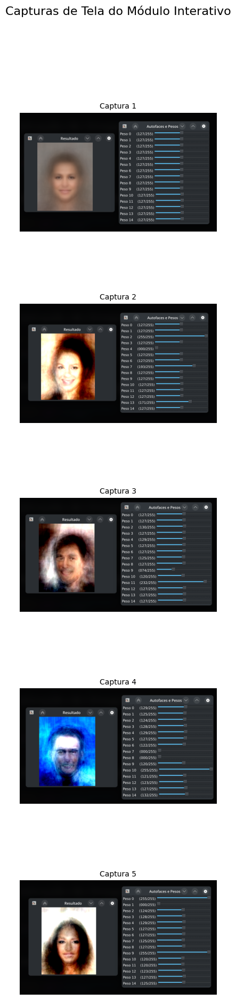

In [4]:
from auxiliares import ler_imagens, exibir_imagens
imagens = ler_imagens("../assets/images/preview")
titulos_imagens = [f"Captura {i+1}" for i in range(len(imagens))]

exibir_imagens(imagens, num_colunas=1, titulo_grid="Capturas de Tela do Módulo Interativo", titulos_imagens=titulos_imagens)

### Utilização do Módulo 1

Para utilizar o módulo 1, basta executar a célula abaixo. Em seguida, as janelas interativas serão abertas, permitindo a manipulação dos pesos associados às autofaces para criar novas imagens faciais.

In [5]:
from construcao import executar_construcao

diretorio_imagens = "../assets/images/database_1"
executar_construcao(diretorio_imagens)

# Módulo 2: Aproximação e Compressão de Imagens

O módulo de aproximação de imagens utiliza o método Eigenfaces para reconstruir imagens em um espaço de baixa dimensionalidade, mantendo as características principais. Esse processo é baseado na combinação linear de autofaces, adicionada à face média, como mostrado na fórmula:

$$
F = F_m + \sum_{i=1}^{k} \alpha_i F_i,
$$

onde:
- $F$ é a imagem aproximada,
- $F_m$ é a face média,
- $F_i$ é a $i$-ésima autoface,
- $\alpha_i$ é o coeficiente (ou peso) correspondente à $i$-ésima autoface,
- $k$ é o número de autofaces utilizadas.

Uma forma mais compacta de representar o mesmo processo é através da fórmula matricial:

$$
\alpha = \text{Autofaces}^T \cdot (F_{\text{original}} - F_m),
$$

e a reconstrução é dada por:

$$
F_{\text{aproximada}} = \text{Autofaces} \cdot \alpha + F_m,
$$

onde:
- $\text{Autofaces}$ é a matriz cujas colunas correspondem às autofaces achatadas,
- $\alpha$ é o vetor de pesos calculado projetando a imagem centralizada no espaço das autofaces.


### Etapas do Processo

1. **Centralização da Imagem de Entrada**:
   A imagem a ser aproximada ($F_{\text{original}}$) é centralizada subtraindo a face média $F_m$. Isso remove as características médias, permitindo que as autofaces capturem apenas as variações:

  $$
   F_{\text{centralizado}} = F_{\text{original}} - F_m.
  $$

2. **Projeção no Espaço das Autofaces**:
   A imagem centralizada é projetada no espaço das autofaces para calcular os coeficientes $\alpha_i$. Essa projeção é realizada pelo produto interno entre a imagem centralizada e cada autoface ($F_i$):

  $$
   \alpha_i = \langle F_{\text{centralizado}}, F_i \rangle.
  $$

   Matematicamente, isso pode ser expresso como:

  $$
   \alpha = \text{Autofaces}^T \cdot F_{\text{centralizado}},
  $$

   onde:
   - $\alpha$ é o vetor de coeficientes calculado.

3. **Reconstrução da Imagem**:
   A reconstrução da imagem aproximada combina as contribuições ponderadas das autofaces ($\alpha_i F_i$) e adiciona novamente a face média $F_m$:

  $$
   F_{\text{aproximada}} = \text{Autofaces} \cdot \alpha + F_m.
  $$


#### Por que subtraímos a face média?

1. **Centralizar os Dados**:
   - Subtrair a face média $F_m$ de cada imagem original $F_{\text{original}}$ centraliza os dados no espaço de autofaces. Isso significa que o espaço projetado terá média zero, facilitando a análise de variações faciais.
   - Em termos matemáticos, centralizar os dados remove a componente média, permitindo que as autofaces capturem apenas as **diferenças** ou **variações** em relação à face média.

  $$
   F_{\text{centralizado}} = F_{\text{original}} - F_m
  $$

2. **Facilitar o Cálculo da Matriz de Covariância**:
   - O PCA é baseado na matriz de covariância dos dados. Se os dados não forem centralizados, a matriz de covariância incluirá contribuições da média, o que pode distorcer os autovetores (autofaces) e os autovalores.

3. **Capturar Variações Específicas**:
   - Sem a subtração da face média, as autofaces também capturariam as características médias das imagens (como uma "sombra" da média). Subtraindo a face média, garantimos que as autofaces representem apenas as direções principais de variação nos dados.


#### Por que somamos a face média depois?

1. **Reconstrução da Imagem Original**:
   - A imagem aproximada $F_{\text{aproximada}}$ é composta pelas contribuições das autofaces adicionadas de volta à face média. Isso é necessário porque, ao subtrair a face média, removemos uma parte importante da informação original da imagem.
   - A soma da face média garante que a reconstrução final esteja no mesmo espaço das imagens originais.

  $$
   F_{\text{aproximada}} = \text{Autofaces} \cdot \alpha + F_m
  $$

2. **Manter a Consistência Visual**:
   - A face média contém características comuns compartilhadas entre todas as imagens do dataset. Essas características não devem ser perdidas na reconstrução, pois são essenciais para representar a imagem de forma completa e visualmente consistente.

3. **Inversão do Processo de Centralização**:
   - A subtração inicial centralizou os dados em torno da origem (média zero). A adição posterior "desfaz" essa centralização, retornando os dados ao espaço original, onde podem ser visualizados e comparados com a imagem original.

#### Resumo Intuitivo

- **Subtração da face média**:
  - Remove o "ruído" comum a todas as imagens e facilita a identificação de padrões únicos.
  - Permite que as autofaces capturem apenas variações significativas entre as imagens.

- **Adição da face média**:
  - Restaura as características médias removidas no início, garantindo que a reconstrução se pareça com a imagem original.

#### Analogia Simples

Imagine que você está comparando notas de estudantes em uma turma. Para entender quem foi "melhor que a média" ou "abaixo da média", você subtrai a nota média da turma de cada estudante. Isso destaca as variações em relação à média. No final, para reconstruir a nota original, você adiciona novamente a média. Fez sentido?

O mesmo ocorre no método Eigenfaces: subtraímos a média para capturar as variações e somamos novamente para reconstruir a informação completa. 🙂


### Relação com o PCA

O PCA (Análise de Componentes Principais) é o método subjacente para calcular as autofaces. Ele identifica as direções principais de variação nos dados (autovetores da matriz de covariância) e ordena essas direções de acordo com sua importância (autovalores).

1. **Redução Dimensional**:
   O PCA permite que as imagens sejam projetadas em um subespaço de baixa dimensionalidade, definido pelas $k$ autofaces principais.

2. **Reconstrução Parcial**:
   Ao utilizar apenas $k < n$ autofaces, o método mantém as informações mais relevantes e descarta os detalhes de alta frequência ou ruído, resultando em uma aproximação suave para valores baixos de $k$.

3. **Ajuste Progressivo**:
   Quanto maior o valor de $k$, mais informações são adicionadas à imagem reconstruída, aproximando-a da original. Para $k = n$, a reconstrução é perfeita, pois todas as autofaces são utilizadas.

### Cenários Avaliados

1. **Imagem já existente na base de dados:**
   - Base de dados utilizada: **CelebA**.
   - Uma imagem que já fazia parte do conjunto utilizado para calcular as autofaces.
   - O resultado foi uma aproximação quase perfeita, mesmo com poucos autovalores ($k \geq 100$). Isso demonstra que o método é altamente eficiente para reconstruir imagens previamente conhecidas.

2. **Imagem semelhante a outras na base de dados:**
   - Base de dados utilizada: **Yale Faces**.
   - Uma imagem que não fazia parte diretamente do conjunto, mas possuía características semelhantes às imagens presentes na base.
   - A aproximação capturou as características gerais da imagem com $k \leq 200$. Para valores maiores de $k$, os detalhes específicos começaram a se alinhar com a imagem original, destacando a capacidade do método de generalizar a partir de padrões semelhantes.

3. **Imagem completamente fora da base (em escala de cinza):**
   - Base de dados utilizada: **Yale Faces**.
   - Uma imagem em escala de cinza sem nenhuma relação com as imagens da base utilizada para calcular as autofaces.
   - A aproximação resultou em imagens que refletiam padrões genéricos do dataset, mas sem reproduzir os detalhes específicos da imagem de teste. Isso evidencia a limitação do método para imagens que não compartilham características significativas com as da base. Esse aqui me surpreendeu ao conseguir reconstruir a imagem, mesmo limitada em detalhes. 😲

4. **Imagem completamente fora da base (colorida):**
   - Base de dados utilizada: **CelebA**.
   - Uma imagem colorida sem nenhuma relação com as imagens da base de dados.
   - O método tentou adaptar a imagem colorida às características gerais do conjunto de autofaces, mas os resultados foram distorcidos, especialmente para valores baixos de $k$. Com valores maiores de $k$, mais detalhes foram recuperados, embora a imagem aproximada ainda refletisse as limitações impostas pela base de dados utilizada. Esse aqui também me surpreendeu ao conseguir reconstruir a imagem, mesmo limitada em detalhes. 😲

### Observações Gerais

- **Dependência do Dataset**:
  A qualidade da aproximação está diretamente relacionada ao conjunto de dados utilizado para calcular as autofaces. Imagens que compartilham características com o dataset tendem a ser reconstruídas com maior precisão.

- **Número de Autofaces ($k$)**:
  O aumento do número de autofaces melhora progressivamente a qualidade da aproximação. Para valores baixos de $k$, apenas características gerais são mantidas, resultando em imagens desfocadas ou genéricas. Com valores altos de $k$, os detalhes específicos são recuperados, aproximando-se da imagem original.

- **Limitações**:
  Para imagens completamente fora da base, o método Eigenfaces não consegue capturar características específicas, limitando-se a projetar as imagens no espaço formado pelas autofaces disponíveis.

Segue o texto para o bônus sobre **Compressão de Imagens**:

### Um bônus: A Compressão de Imagens

A fórmula utilizada para a reconstrução de imagens no método Eigenfaces, 

$$
F_{\text{aproximada}} = \text{Autofaces} \cdot \alpha + F_m,
$$

não apenas permite aproximar imagens, mas também possibilita a **compressão eficiente de imagens**. Esse processo é baseado na redução dimensional oferecida pelo PCA (Análise de Componentes Principais), que seleciona as principais variações nos dados para representá-los com menos informações.

#### Como a compressão funciona?

No contexto de Eigenfaces, a compressão de imagens ocorre porque utilizamos apenas um subconjunto das autofaces (autovetores) mais significativas para representar a imagem, em vez de armazenar todos os pixels originais. Esse subconjunto é suficiente para capturar as principais características da imagem.

1. **Representação da Imagem Original**:
   - Uma imagem original $F_{\text{original}}$ com dimensões $h \times w$ contém $d = h \cdot w $valores (ou $d \cdot 3$ para imagens coloridas).
   - Em uma base de autofaces, a imagem pode ser representada pelos coeficientes $\alpha$ e pela face média $F_m$.

2. **Redução Dimensional**:
   - Em vez de armazenar todos os $d$ valores, armazenamos apenas:
     - $k$ coeficientes$\alpha$,
     - Os $k$ autofaces correspondentes (compartilhados entre todas as imagens),
     - A face média $F_m$ (também compartilhada entre todas as imagens).
   - Isso reduz significativamente a quantidade de dados necessários para armazenar ou transmitir a imagem.

3. **Reconstrução Parcial**:
   - Para reconstruir a imagem aproximada, combinamos os coeficientes $\alpha$ com as autofaces $\text{Autofaces}$ e somamos a face média:
    $$
     F_{\text{aproximada}} = \text{Autofaces} \cdot \alpha + F_m.
    $$
   - Embora a imagem reconstruída não seja idêntica à original, ela preserva as características mais importantes, especialmente para valores maiores de $k$.


#### Benefícios da Compressão

1. **Redução no Armazenamento**:
   - O armazenamento de apenas $k$ coeficientes e autofaces, em vez de todos os pixels originais, reduz significativamente o espaço necessário, especialmente para imagens de alta resolução.

2. **Eficiência no Transporte de Dados**:
   - Em aplicações como reconhecimento facial, apenas os coeficientes $\alpha$ precisam ser transmitidos, economizando largura de banda em redes.

3. **Reconstrução Controlada**:
   - A qualidade da reconstrução pode ser ajustada aumentando ou diminuindo o número de autofaces ($k$). Isso oferece um controle direto sobre o equilíbrio entre qualidade e tamanho dos dados.


#### Um Exemplo de Compressão

A compressão de imagens utilizando autofaces pode ser exemplificada com uma imagem em escala de cinza de dimensões $h = 180$ e $w = 220$, o que resulta em $d = h \cdot w = 39,600$ pixels. Vamos comparar os cenários **sem compressão** e **com compressão** para um dataset de $n = 1,000$ imagens e $k = 100$ autofaces.

#### Cenário 1: Sem Compressão

No cenário sem compressão, cada imagem é armazenada em sua totalidade, com todos os pixels representados individualmente:

1. **Tamanho por Imagem**:
   - Cada imagem contém $d = 39,600$ valores.

2. **Total para $n = 1,000$ Imagens**:
   - O total de dados armazenados é:
    $$
     \text{Dados totais (sem compressão)} = n \cdot d = 1,000 \cdot 39,600 = 39,600,000 \, \text{valores}.
    $$


#### Cenário 2: Com Compressão

Com a compressão baseada em autofaces, armazenamos os dados de maneira compactada:

1. **Representação por Imagem**:
   - Cada imagem é representada pelos $k = 100$ coeficientes $\alpha$, que capturam as contribuições das autofaces.

2. **Armazenamento Compartilhado**:
   - As autofaces ($\text{Autofaces}$) e a face média ($F_m$) são compartilhadas entre todas as imagens:
     - As $k = 100$ autofaces têm $k \cdot d = 100 \cdot 39,600 = 3,960,000$ valores.
     - A face média possui $d = 39,600$ valores.
   - O custo compartilhado é:
    $$
     \text{Custo compartilhado} = k \cdot d + d = 3,960,000 + 39,600 = 3,999,600 \, \text{valores}.
    $$

3. **Total para $n = 1,000$ Imagens**:
   - O total de dados armazenados é:
    $$
     \text{Dados totais (com compressão)} = n \cdot k + (k \cdot d + d).
    $$
   - Substituindo os valores:
    $$
     \text{Dados totais (com compressão)} = 1,000 \cdot 100 + 3,960,000 + 39,600 = 4,099,600 \, \text{valores}.
    $$

#### Comparação dos Cenários

1. **Sem Compressão**:
   - Total de dados: $39,600,000 \, \text{valores}$.

2. **Com Compressão**:
   - Total de dados: $4,099,600 \, \text{valores}$.

3. **Redução de Tamanho**:
   - A compressão reduz o tamanho necessário em:
    $$
     \text{Redução} = \frac{\text{Dados totais (sem compressão)} - \text{Dados totais (com compressão)}}{\text{Dados totais (sem compressão)}} \cdot 100\%.
    $$
     Substituindo:
    $$
     \text{Redução} = \frac{39,600,000 - 4,099,600}{39,600,000} \cdot 100\% \approx 89.65\%.
    $$

     Mostrando que a compressão reduziu o tamanho dos dados em quase 90%! (Absolute Cinema 😎)

#### Aplicações Práticas

A compressão de imagens baseada em autofaces é amplamente utilizada em aplicações como:
- **Reconhecimento Facial**:
  Apenas os coeficientes $\alpha$ são comparados, reduzindo o custo computacional.
- **Armazenamento de Dados**:
  Imagens podem ser armazenadas em formatos compactos sem perda significativa de informações relevantes.
- **Transmissão de Imagens**:
  Dados compactados podem ser enviados rapidamente para reconstrução em outro local.

#### Limitações

Embora eficiente, essa técnica apresenta algumas limitações:
- **Perda de Informações**:
  Para valores baixos de $k$, detalhes finos podem ser descartados, resultando em imagens desfocadas.
- **Dependência do Dataset**:
  A compressão é otimizada para imagens que compartilham características com o dataset utilizado para calcular as autofaces.

A compressão de imagens via Eigenfaces é uma demonstração poderosa de como a matemática aplicada pode otimizar o armazenamento e a manipulação de dados visuais, ao mesmo tempo que mantém a essência das informações originais.

### Conclusão

O método Eigenfaces demonstrou ser altamente eficaz para reconstruir imagens presentes ou semelhantes às do dataset. Para imagens fora do conjunto de dados, os resultados refletem as restrições impostas pela base de autofaces, destacando a importância de um dataset abrangente e representativo para aplicações práticas. Além disso, para a compressão de imagens, a técnica oferece uma maneira eficiente de reduzir o espaço de armazenamento e a largura de banda necessária, mantendo a capacidade de reconstrução visualmente significativa.

A utilização do módulo 2 pode ser utilizada e analisada abaixo, com a execução da célula.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.027175397..1.1032436].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053443998..1.1663679].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12636262..1.2131017].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14154574..1.2079031].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14778033..1.1838682].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.119611174..1.1252077].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [

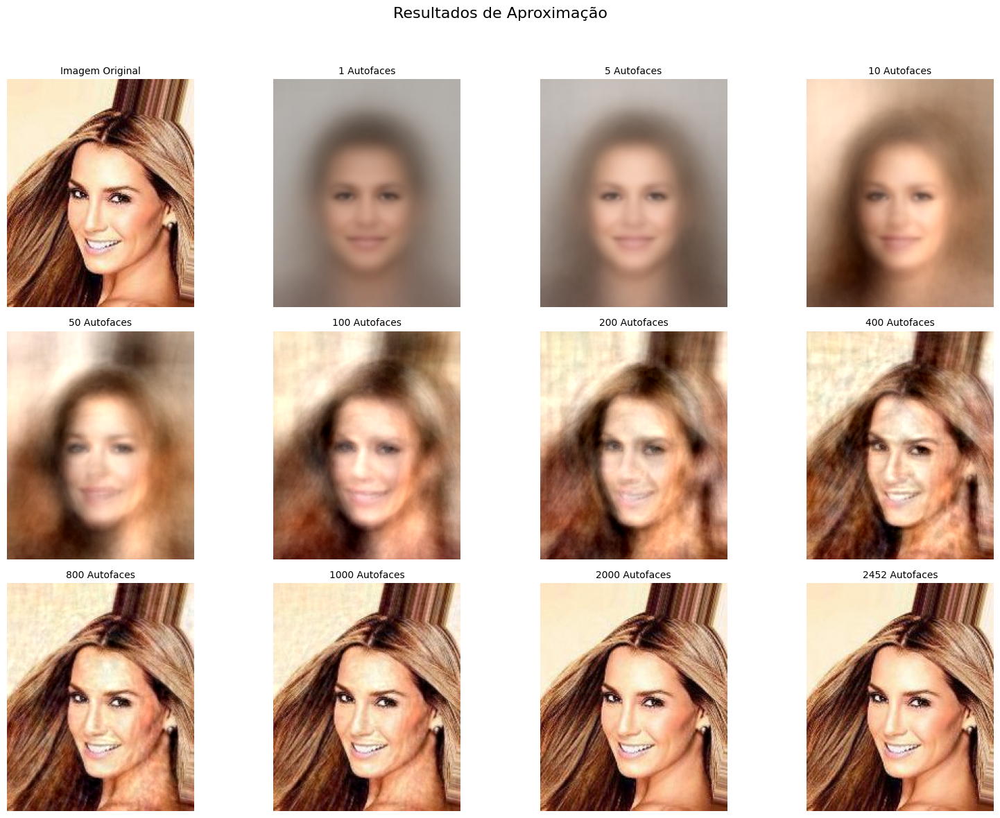

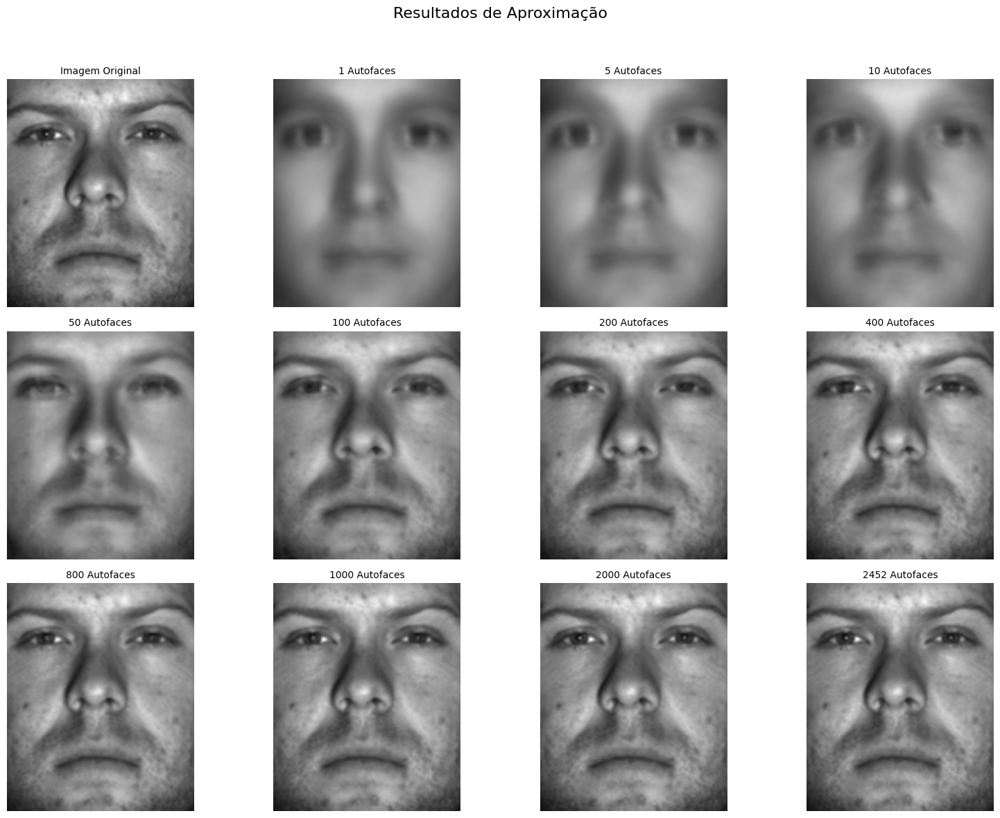

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00030691922..1.2089179].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0018287301..1.2336657].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021290004..1.1697545].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05014567..1.1792191].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.006839156..1.1385707].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015295267..1.1662333].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

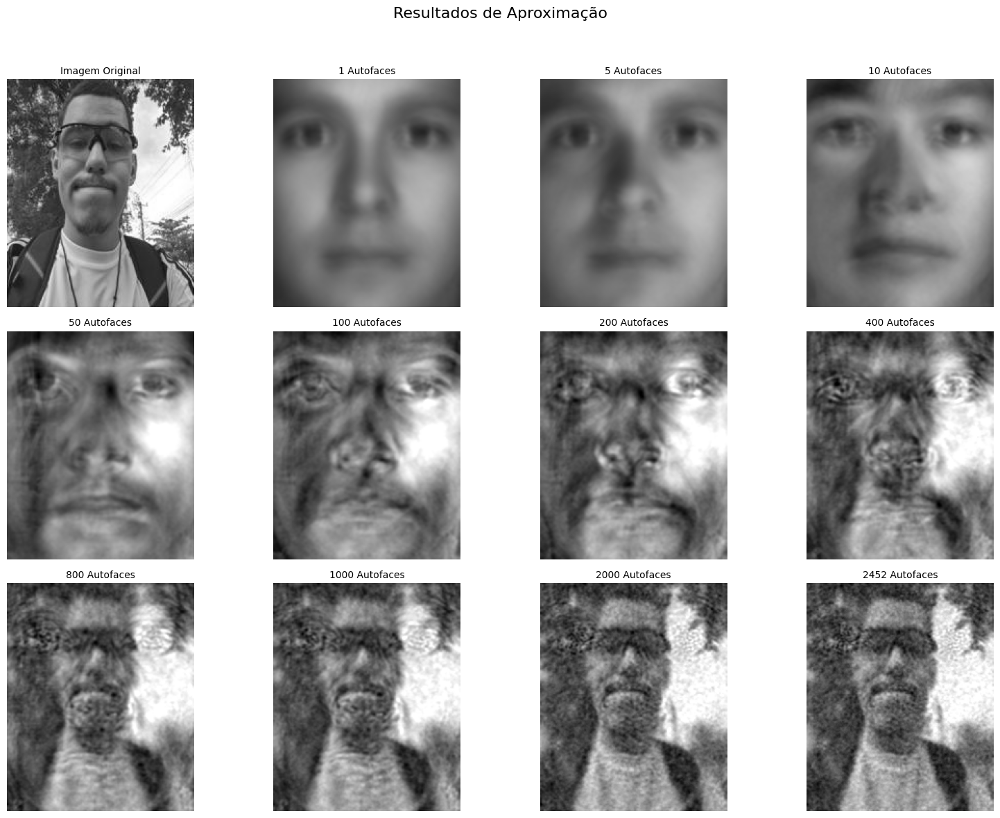

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.060834765..1.1442573].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04059583..1.1754804].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.017413825..1.1168244].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012780637..1.1692182].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026648045..1.159915].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.004168153..1.151226].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0

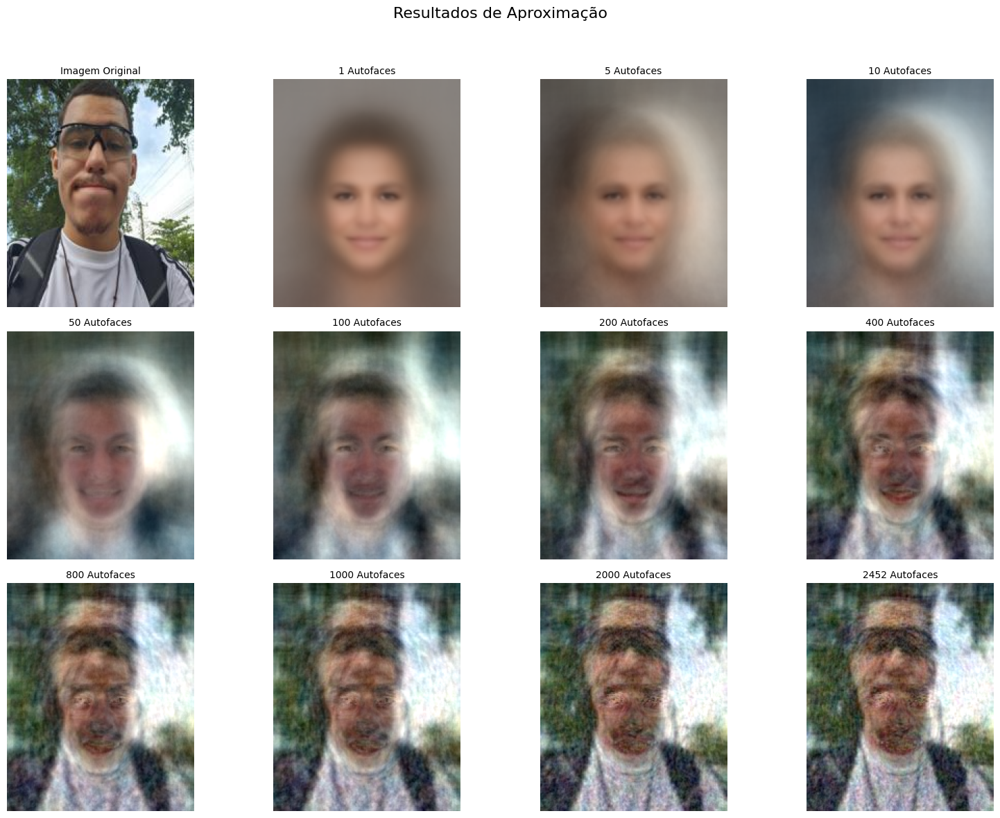

In [6]:
from aproximacao import executar_aproximacao
from auxiliares import ler_imagens

lista_autofaces = [1, 5, 10, 50, 100, 200, 400, 800, 1000, 2000, 2452]
imagens = ler_imagens(diretorio_imagens, limite=1)  

executar_aproximacao(diretorio_imagens, imagens[0], lista_autofaces, limite=2452)

lista_autofaces = [1, 5, 10, 50, 100, 200, 400, 800, 1000, 2000, 2452]
diretorio_teste = "../assets/images/test/pessoa_3.png" 
diretorio_imagens = "../assets/images/database_4"
imagem_teste = ler_imagens(diretorio_teste, limite=1)[0]

executar_aproximacao(diretorio_imagens, imagem_teste, lista_autofaces, limite=2452)

lista_autofaces = [1, 5, 10, 50, 100, 200, 400, 800, 1000, 2000, 2452]
diretorio_teste = "../assets/images/test/miltin_cinza.png"
diretorio_imagens = "../assets/images/database_3"
imagem_teste = ler_imagens(diretorio_teste, limite=1)[0]

executar_aproximacao(diretorio_imagens, imagem_teste, lista_autofaces, limite=2452)

lista_autofaces = [1, 5, 10, 50, 100, 200, 400, 800, 1000, 2000, 2452] 
diretorio_teste = "../assets/images/test/miltin.jpg"
diretorio_imagens = "../assets/images/database_1"
imagem_teste = ler_imagens(diretorio_teste, limite=1)[0]

executar_aproximacao(diretorio_imagens, imagem_teste, lista_autofaces, limite=2452)

# Módulo 3: Classificação de Imagens com Eigenfaces

Este módulo explora como o método Eigenfaces pode ser utilizado para classificar imagens projetando-as em um espaço tridimensional formado por autofaces. A abordagem é simples: as imagens são projetadas no subespaço gerado pelas três autofaces principais, criando um espaço tridimensional em que cada ponto corresponde à projeção de uma imagem. Utilizei a base de dados **ORL Database of Faces** para este módulo.

### Etapas do Processo

1. **Seleção das Autofaces**:
   - Utilizamos as três autofaces mais significativas (os três maiores autovetores da matriz de covariância) para formar o subespaço tridimensional. Essas autofaces capturam as maiores variações presentes no dataset.

2. **Projeção no Subespaço**:
   - Cada imagem é centralizada subtraindo a face média $F_m$:
    $$
     F_{\text{centralizado}} = F_{\text{original}} - F_m.
    $$
   - A imagem centralizada é projetada no subespaço tridimensional multiplicando-se pelas autofaces:
    $$
     \alpha = \text{Autofaces}^T \cdot F_{\text{centralizado}},
    $$
     onde $\alpha = (\alpha_1, \alpha_2, \alpha_3)$ são os pesos que representam a contribuição de cada autoface para a imagem.

3. **Representação Visual**:
   - As projeções $\alpha$ de cada imagem são visualizadas em um gráfico tridimensional, onde cada classe (ou pessoa) é representada por uma cor e um marcador diferente. Isso facilita a separação visual entre as classes.

4. **Classificação Implícita**:
   - A localização dos pontos no subespaço tridimensional reflete a similaridade entre as imagens. Imagens de uma mesma pessoa tendem a se agrupar em regiões próximas, enquanto imagens de pessoas diferentes aparecem em regiões distintas.

### Resultados Obtidos

O gráfico abaixo apresenta as projeções das imagens de três pessoas diferentes no subespaço tridimensional formado pelas autofaces:

- **Classe Pessoa 1**: Representada pelos pontos vermelhos.
- **Classe Pessoa 2**: Representada pelos triângulos azuis.
- **Classe Pessoa 3**: Representada pelos quadrados verdes.

Como podemos observar:
- As projeções de imagens pertencentes a uma mesma pessoa formam agrupamentos bem definidos no subespaço tridimensional.
- As classes de pessoas diferentes aparecem em regiões distintas do espaço, evidenciando a capacidade discriminativa das autofaces.

### Interpretação

O espaço tridimensional gerado pelas autofaces funciona como uma **representação compactada e discriminativa** das imagens. Esse método é particularmente útil para problemas de classificação facial porque reduz a dimensionalidade dos dados, preservando as informações mais relevantes.

### Aplicações Práticas

Este módulo demonstra como o método Eigenfaces pode ser aplicado em tarefas como:
- **Reconhecimento Facial**:
  - Identificação de indivíduos a partir de projeções em espaços de baixa dimensionalidade.
- **Redução de Dimensionalidade para Classificação**:
  - Criação de representações compactas que facilitam algoritmos de aprendizado de máquina.
- **Agrupamento Não-Supervisionado**:
  - Agrupamento de imagens com base em similaridades visuais no espaço das autofaces.

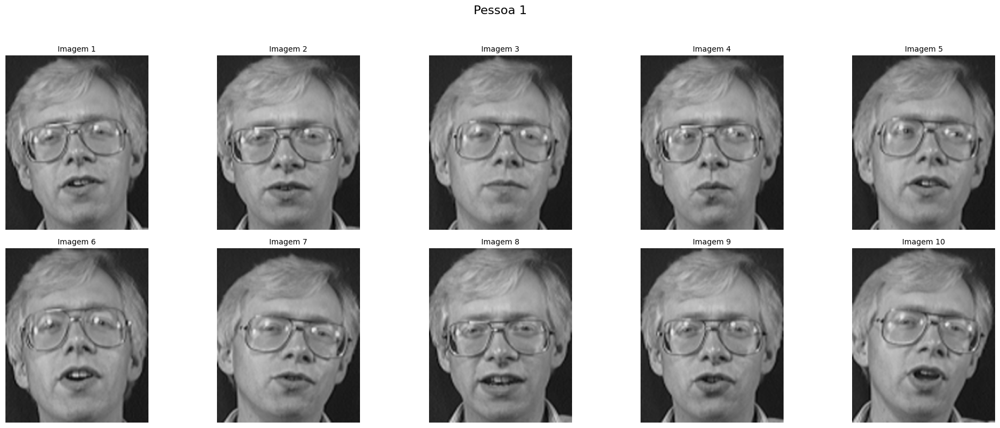

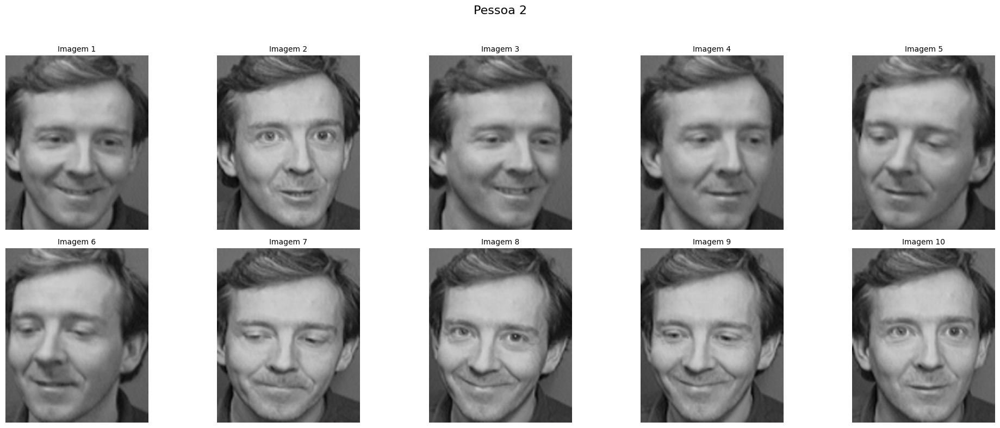

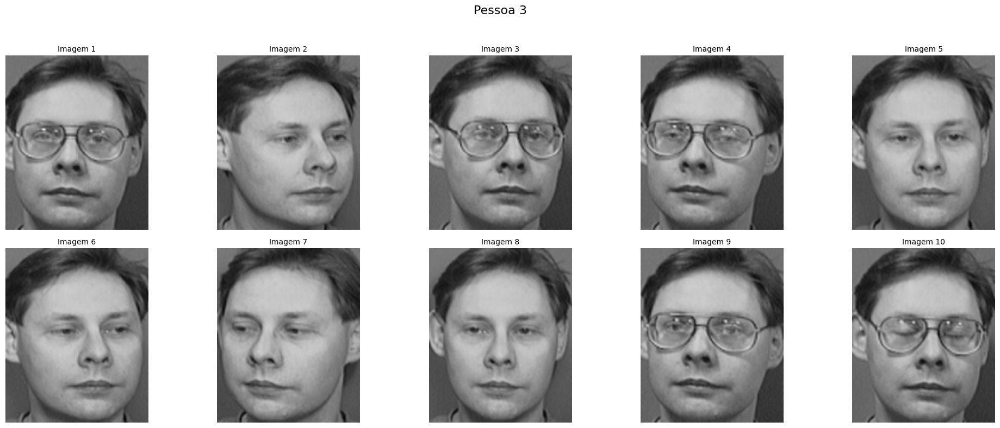

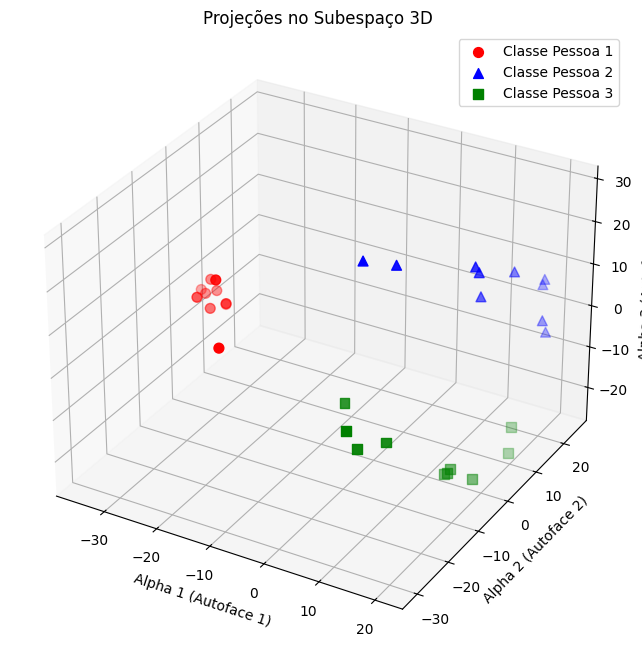

In [7]:
from classificacao import executar_classificacao

diretorios = ["../assets/images/database_2/s2", 
              "../assets/images/database_2/s3",
              "../assets/images/database_2/s4"]

executar_classificacao(diretorios)

# Módulo 4: Reconhecimento de Imagens

O módulo de reconhecimento facial utiliza o método Eigenfaces em conjunto com a métrica da distância euclidiana para identificar a imagem mais semelhante a uma imagem de teste dentro de uma base de dados.

### Etapas do Processo

1. **Cálculo da Face Média e Autofaces**:
   - A base de imagens é processada para calcular a face média $F_m$ e um número pré-definido $k$ de autofaces $F_i$ . Essas autofaces capturam as variações mais importantes dentro do dataset.

2. **Projeção e Vetores de Pesos**:
   - Cada imagem na base e a imagem de teste são centralizadas subtraindo $F_m$.
   - As imagens centralizadas são projetadas no espaço das autofaces, produzindo vetores de pesos $\alpha$ que representam a contribuição de cada autoface para a imagem. Para a imagem de teste:
    $$
     \alpha_{\text{teste}} = \text{Autofaces}^T \cdot (F_{\text{teste}} - F_m).
    $$
   - Vetores de pesos similares indicam imagens semelhantes no espaço das autofaces.

3. **Cálculo da Similaridade**:
   - A distância euclidiana é utilizada para medir a similaridade entre o vetor de pesos da imagem de teste $\alpha_{\text{teste}}$ e os vetores de pesos da base:
    $$
     d_i = \| \alpha_{\text{teste}} - \alpha_i \|,
    $$
     onde $\alpha_i$ representa o vetor de pesos da $i$-ésima imagem na base.
   - A imagem da base com a menor distância $d_i$ é considerada a mais semelhante.

4. **Exibição dos Resultados**:
   - A imagem de teste e a imagem reconhecida são exibidas lado a lado para visualização.

### Resultados Obtidos

Os resultados do módulo são apresentados nas imagens abaixo:

1. **Teste 1 (5 Autofaces)**:
   - Imagem de teste: Pessoa não correspondente encontrada na base.
   - Resultado: A imagem reconhecida tem algumas características similares, mas não é a mesma pessoa. Isso demonstra que o uso de poucas autofaces pode levar a imprecisões em datasets variados.

2. **Teste 1 (200 Autofaces)**:
   - Imagem de teste: Pessoa encontrada na base.
   - Resultado: A pessoa reconhecida é a mesma que a imagem de teste, confirmando a eficácia do método com um número maior de autofaces.

3. **Teste 2 (5 Autofaces)**:
   - Imagem de teste: Pessoa encontrada na base.
   - Resultado: A pessoa reconhecida é a mesma que a imagem de teste, mas isso só aconteceu por conta da alta similaridade entre as imagens. Em casos mais complexos, o método pode identificar erroneamente uma imagem semelhante. Para verificar, fazemos um novo teste com essa mesma imagem, porém com mais autofaces.

4. **Teste 2 (200 Autofaces)**:
   - Imagem de teste: Pessoa encontrada na base.
   - Resultado: A imagem reconhecida é a mesma que a imagem de teste, confirmando a eficácia do método com mais autofaces e comprovando que no teste anterior de fato a alta semelhança entre as imagens foi crucial para o reconhecimento, mesmo que o teste anterior usou apenas 5 autofaces.

### Conclusões

- **Precisão Dependente de $k$**:
  - Um número maior de autofaces aumenta a precisão, especialmente em datasets variados.

- **Limitações**:
  - Para imagens externas ou bases não representativas, o método pode identificar erroneamente uma imagem semelhante.

- **Aplicações**:
  - Reconhecimento facial em bases conhecidas.
  - Verificação de identidade e agrupamento de imagens por similaridade.

O módulo demonstrou como o uso de projeções em autofaces e métricas de similaridade podem ser aplicados para reconhecimento facial de maneira eficaz, destacando a importância de um dataset bem representado.

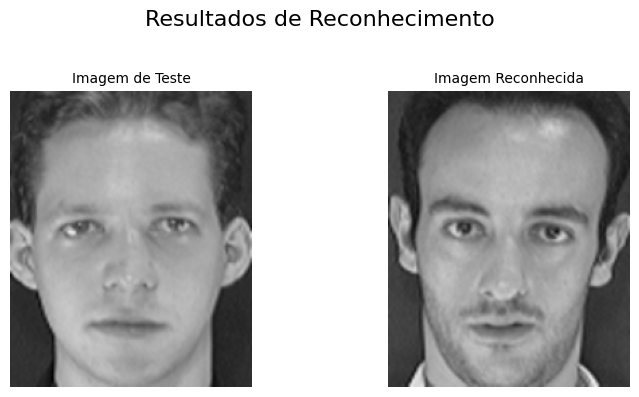

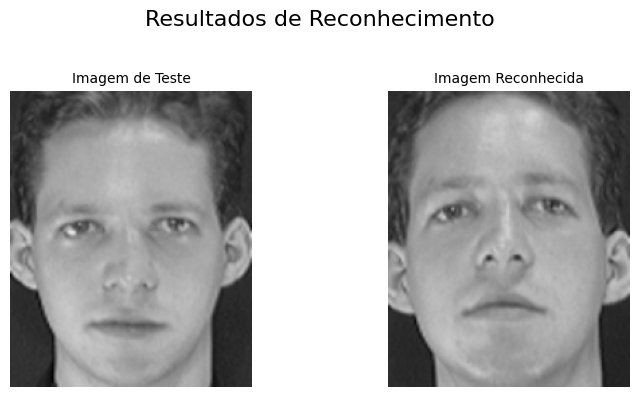

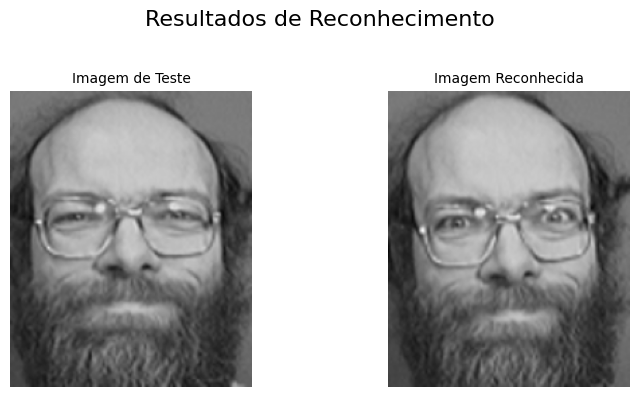

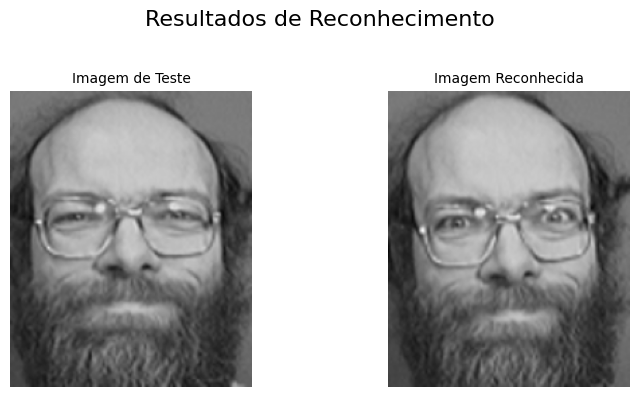

In [8]:
from reconhecimento import executar_reconhecimento

diretorio_base = "../assets/images/database_2"

diretorio_teste = "../assets/images/test/pessoa_1.png"

executar_reconhecimento(
    diretorio_base=diretorio_base,
    diretorio_teste=diretorio_teste,
    num_autofaces=5,
    limite_base=400
)

executar_reconhecimento(
    diretorio_base=diretorio_base,
    diretorio_teste=diretorio_teste,
    num_autofaces=200,
    limite_base=400
)

diretorio_teste = "../assets/images/test/pessoa_2.png"

executar_reconhecimento(
    diretorio_base=diretorio_base,
    diretorio_teste=diretorio_teste,
    num_autofaces=5,
    limite_base=400
)

executar_reconhecimento(
    diretorio_base=diretorio_base,
    diretorio_teste=diretorio_teste,
    num_autofaces=200,
    limite_base=400
)

# Referências

1. BELHUMEUR, P. N.; HESPANHA, J. P.; KRIEGMAN, D. J. Eigenfaces vs. Fisherfaces: recognition using class specific linear projection. *IEEE Transactions on Pattern Analysis and Machine Intelligence*, v. 19, n. 7, p. 711–720, jul. 1997.

2. TURK, Matthew; PENTLAND, Alex. Eigenfaces for Recognition. *Journal of Cognitive Neuroscience*, v. 3, n. 1, p. 71–86, 1991.

3. WIKIPEDIA CONTRIBUTORS. Eigenface. Disponível em:  
   <https://en.wikipedia.org/wiki/Eigenface>. Acesso em: 19 nov. 2024.

4. THELRY, D.; BISSI. *Reconhecimento Facial: Algoritmos*. Universidade Federal de Uberlândia. Disponível em:  
   <https://repositorio.ufu.br/bitstream/123456789/22158/3/ReconhecimentoFacialAlgoritmos.pdf>. Acesso em: 19 nov. 2024.

5. PESSOA, Willian G. *Reconhecimento de Padrões: Eigenfaces*. Medium, 2019. Disponível em:  
   <https://medium.com/@williangpessoa/reconhecimento-de-padr%C3%B5es-eigenfaces-e4cef8f04919>. Acesso em: 19 nov. 2024.

6. OpenCV: Open Source Computer Vision Library. Disponível em:  
   <https://opencv.org/>. Acesso em: 19 nov. 2024.

7. NumPy: The fundamental package for array computing with Python. Disponível em:  
   <https://numpy.org/>. Acesso em: 19 nov. 2024.

8. Matplotlib: Visualization with Python. Disponível em:  
   <https://matplotlib.org/>. Acesso em: 19 nov. 2024.